In [1]:
import os

## Set directory
os.chdir('/hpc/group/pbenfeylab/CheWei/CW_data/genesys')

import networkx as nx
from genesys_evaluate import *
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
## Conda Env pytorch-gpu on DCC
print(torch.__version__)
print(sc.__version__) 

1.13.0.post200
1.9.1


In [3]:
## Genes considered/used (shared among samples) 
gene_list = pd.read_csv('./gene_list_1108.csv')

## Load data

In [4]:
with open("./genesys_root_data.pkl", 'rb') as file_handle:
    data = pickle.load(file_handle)
    
batch_size = 2000
dataset = Root_Dataset(data['X_test'], data['y_test'])
loader = DataLoader(dataset,
                         batch_size = batch_size,
                         shuffle = True, drop_last=True)
train_dataset = Root_Dataset(data['X_train'], data['y_train'])
train_loader = DataLoader(train_dataset,
                         batch_size = batch_size,
                         shuffle = True, drop_last=True)

In [5]:
with open("./genesys_rswt_data.pkl", 'rb') as file_handle:
    data = pickle.load(file_handle)

X_all = np.vstack((data['X_train'],data['X_val'],data['X_test']))
y_all = pd.concat((data['y_train'],data['y_val'],data['y_test']))
unseen_dataset = Root_Dataset_NoQC(X_all, y_all)
unseen_loader = DataLoader(unseen_dataset,
                         batch_size = batch_size,
                         shuffle = True, drop_last=True)

In [6]:
input_size = data['X_train'].shape[1]
## 10 cell types 
output_size = 10
embedding_dim = 256
hidden_dim = 256
n_layers = 2
device = "cpu"
path = "./"

## Load trained GeneSys model (Evaluate)

In [7]:
model = ClassifierLSTM(input_size, output_size, embedding_dim, hidden_dim, n_layers).to(device)
model.load_state_dict(torch.load(path+"best_ALL_1130_continue.pth", map_location=torch.device('cpu')))
model = model
model.eval()

ClassifierLSTM(
  (fc1): Sequential(
    (0): Linear(in_features=17513, out_features=256, bias=True)
    (1): Dropout(p=0.2, inplace=False)
    (2): GaussianNoise()
  )
  (fc): Sequential(
    (0): ReLU()
    (1): Linear(in_features=512, out_features=512, bias=True)
    (2): ReLU()
    (3): Linear(in_features=512, out_features=10, bias=True)
  )
  (lstm): LSTM(256, 256, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (dropout): Dropout(p=0.2, inplace=False)
  (b_to_z): DBlock(
    (fc1): Linear(in_features=512, out_features=256, bias=True)
    (fc2): Linear(in_features=512, out_features=256, bias=True)
    (fc_mu): Linear(in_features=256, out_features=512, bias=True)
    (fc_logsigma): Linear(in_features=256, out_features=512, bias=True)
  )
  (bz2_infer_z1): DBlock(
    (fc1): Linear(in_features=1024, out_features=256, bias=True)
    (fc2): Linear(in_features=1024, out_features=256, bias=True)
    (fc_mu): Linear(in_features=256, out_features=512, bias=True)
    (fc

### Sample data 

In [8]:
classes = ['Columella', 'Lateral Root Cap', 'Phloem', 'Xylem', 'Procambium', 'Pericycle', 'Endodermis', 'Cortex', 'Atrichoblast', 'Trichoblast']
class2num = {c: i for (i, c) in enumerate(classes)}
num2class = {i: c for (i, c) in enumerate(classes)}

In [9]:
sample = next(iter(loader))
xo = sample['x'].to(device)
y = sample['y'].to(device)
y_label = [num2class[i] for i in y.tolist()]

In [10]:
## 2000 cell type trajectories (11 dev stage) sampled, each stage has 17513 gene expression)
xo.shape

torch.Size([2000, 11, 17513])

In [11]:
## How many cell type trajectories are sampled for each cell type?
pd.Series(y_label).value_counts()

Pericycle           217
Atrichoblast        214
Endodermis          212
Procambium          205
Phloem              201
Xylem               199
Lateral Root Cap    194
Cortex              193
Trichoblast         185
Columella           180
dtype: int64

### Provide with time point zero to two with WT samples (TEST SET)

In [13]:
#Prepare 
xm = xo.clone()
## Provide entire tracks
x = torch.stack([xm[:,0,:],xm[:,1,:],xm[:,2,:],xm[:,2,:],xm[:,2,:],xm[:,2,:],xm[:,2,:],xm[:,2,:],xm[:,2,:],xm[:,2,:],xm[:,2,:]],dim=1)

In [14]:
## Initialize hidden state
pred_h = model.init_hidden(batch_size)

# t0 and t1 prediction based on data from the first two time points
t0 = model.generate_current(x, pred_h, 0)
t1 = model.generate_next(x, pred_h, 1)

## predict t1 label
y1, pred_h = model.predict_proba(x, pred_h, 1)
y1 = [num2class[i] for i in np.argmax(y1.cpu().detach().numpy(), axis=1)]

t2 = model.generate_next(x, pred_h, 2)
update_x = torch.stack([t0,t1,t2,t2,t2,t2,t2,t2,t2,t2,t2],dim=1)

y2, pred_h = model.predict_proba(update_x, pred_h, 2)
y2 = [num2class[i] for i in np.argmax(y2.cpu().detach().numpy(), axis=1)]

t3 = model.generate_next(update_x, pred_h, 3)
update_x = torch.stack([t0,t1,t2,t3,t3,t3,t3,t3,t3,t3,t3],dim=1)

y3, pred_h = model.predict_proba(update_x, pred_h, 3)
y3 = [num2class[i] for i in np.argmax(y3.cpu().detach().numpy(), axis=1)]

t4 = model.generate_next(update_x, pred_h, 4)
update_x = torch.stack([t0,t1,t2,t3,t4,t4,t4,t4,t4,t4,t4],dim=1)

y4, pred_h = model.predict_proba(update_x, pred_h, 4)
y4 = [num2class[i] for i in np.argmax(y4.cpu().detach().numpy(), axis=1)]

t5 = model.generate_next(update_x, pred_h, 5)
update_x = torch.stack([t0,t1,t2,t3,t4,t5,t5,t5,t5,t5,t5],dim=1)

y5, pred_h = model.predict_proba(update_x, pred_h, 5)
y5 = [num2class[i] for i in np.argmax(y5.cpu().detach().numpy(), axis=1)]

t6 = model.generate_next(update_x, pred_h, 6)
update_x = torch.stack([t0,t1,t2,t3,t4,t5,t6,t6,t6,t6,t6],dim=1)

y6, pred_h = model.predict_proba(update_x, pred_h, 6)
y6 = [num2class[i] for i in np.argmax(y6.cpu().detach().numpy(), axis=1)]

t7 = model.generate_next(update_x, pred_h, 7)
update_x = torch.stack([t0,t1,t2,t3,t4,t5,t6,t7,t7,t7,t7],dim=1)

y7, pred_h = model.predict_proba(update_x, pred_h, 7)
y7 = [num2class[i] for i in np.argmax(y7.cpu().detach().numpy(), axis=1)]

t8 = model.generate_next(update_x, pred_h, 8)
update_x = torch.stack([t0,t1,t2,t3,t4,t5,t6,t7,t8,t8,t8],dim=1)

y8, pred_h = model.predict_proba(update_x, pred_h, 8)
y8 = [num2class[i] for i in np.argmax(y8.cpu().detach().numpy(), axis=1)]

t9 = model.generate_next(update_x, pred_h, 9)
update_x = torch.stack([t0,t1,t2,t3,t4,t5,t6,t7,t8,t9,t9],dim=1)

y9, pred_h = model.predict_proba(update_x, pred_h, 9)
y9 = [num2class[i] for i in np.argmax(y9.cpu().detach().numpy(), axis=1)]

t10 = model.generate_next(update_x, pred_h, 10)
update_x = torch.stack([t0,t1,t2,t3,t4,t5,t6,t7,t8,t9,t10],dim=1)

y10, pred_h = model.predict_proba(update_x, pred_h, 10)
y10 = [num2class[i] for i in np.argmax(y10.cpu().detach().numpy(), axis=1)]

In [15]:
t0 = t0.to(device).detach().numpy()
t1 = t1.to(device).detach().numpy()
t2 = t2.to(device).detach().numpy()
t3 = t3.to(device).detach().numpy()
t4 = t4.to(device).detach().numpy()
t5 = t5.to(device).detach().numpy()
t6 = t6.to(device).detach().numpy()
t7 = t7.to(device).detach().numpy()
t8 = t8.to(device).detach().numpy()
t9 = t9.to(device).detach().numpy()
t10 = t10.to(device).detach().numpy()

In [16]:
pred_X = np.vstack((t0,t1,t2,t3,t4,t5,t6,t7,t8,t9,t10))
pred_Y = np.concatenate((['Stem Cell']*batch_size, y1, y2, y3, y4, y5, y6, y7, y8, y9, y10)).tolist()
#pred_Y = np.concatenate((['Stem Cell']*batch_size, ['Stem Cell']*batch_size, y2, y3, y4, y5, y6, y7, y8, y9, y10)).tolist()
pred_T = ['t0']*batch_size + ['t1']*batch_size + ['t2']*batch_size + ['t3']*batch_size + ['t4']*batch_size + ['t5']*batch_size + ['t6']*batch_size + ['t7']*batch_size + ['t8']*batch_size+ ['t9']*batch_size + ['t10']*batch_size

In [17]:
pd.DataFrame(pred_X).to_csv("./pred_X_WT02.csv", header=False)
pd.DataFrame(pred_Y).to_csv("./pred_Y_WT02.csv")
pd.DataFrame(pred_T).to_csv("./pred_T_WT02.csv")

In [18]:
adata = sc.read_csv('./pred_X_WT02.csv', first_column_names=True)
pred_Y = pd.read_csv('./pred_Y_WT02.csv')
pred_T = pd.read_csv('./pred_T_WT02.csv')
adata.obs['celltype'] = pred_Y['0'].tolist()
adata.obs['timebin'] = pred_T['0'].tolist()
adata.var.index = gene_list['features']

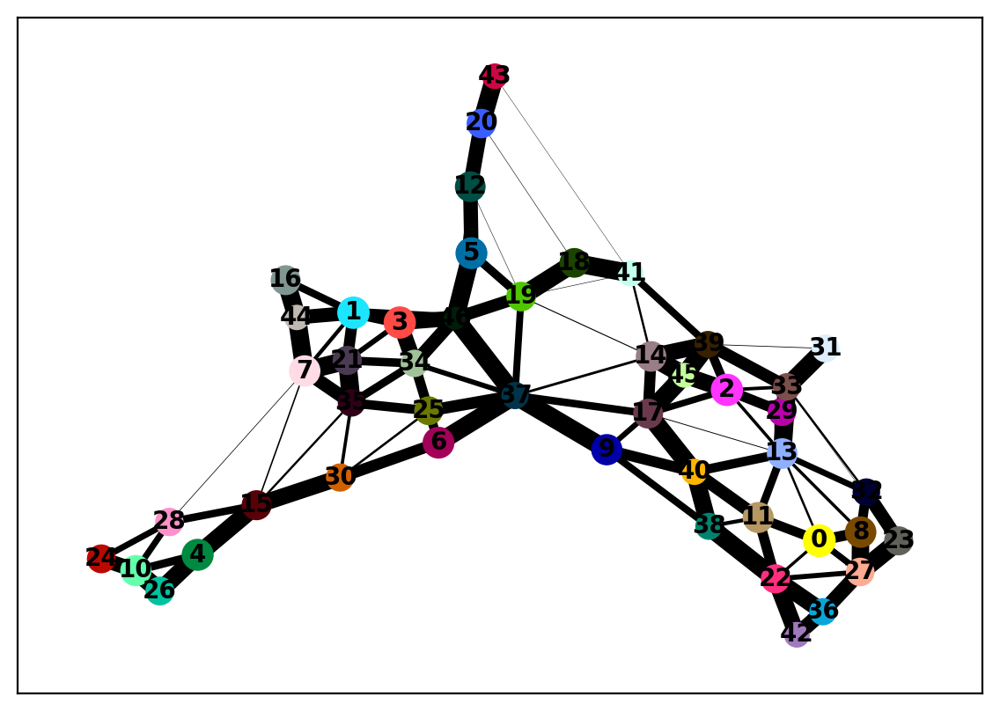

In [19]:
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=50)
sc.tl.leiden(adata)
sc.tl.paga(adata)
sc.pl.paga(adata) 

In [21]:
sc.tl.umap(adata, init_pos='paga')

In [22]:
adata.uns['celltype_colors'] = np.array([ "#9400d3","#5ab953", "#bfef45", "#008080", "#21B6A8", "#82b6ff", "#0000FF","#e6194b", "#9a6324", "#ffe119", "#ff9900", "#ffd4e3", "#9a6324", "#ddaa6f"], dtype=object)
adata.obs['celltype'] = pd.Categorical(adata.obs['celltype'], categories=["Stem Cell","Columella", "Lateral Root Cap", "Atrichoblast", "Trichoblast", "Cortex", "Endodermis", "Phloem", "Xylem", "Procambium","Pericycle"])

/hpc/group/pbenfeylab/ch416/miniconda3/envs/pytorch-gpu/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


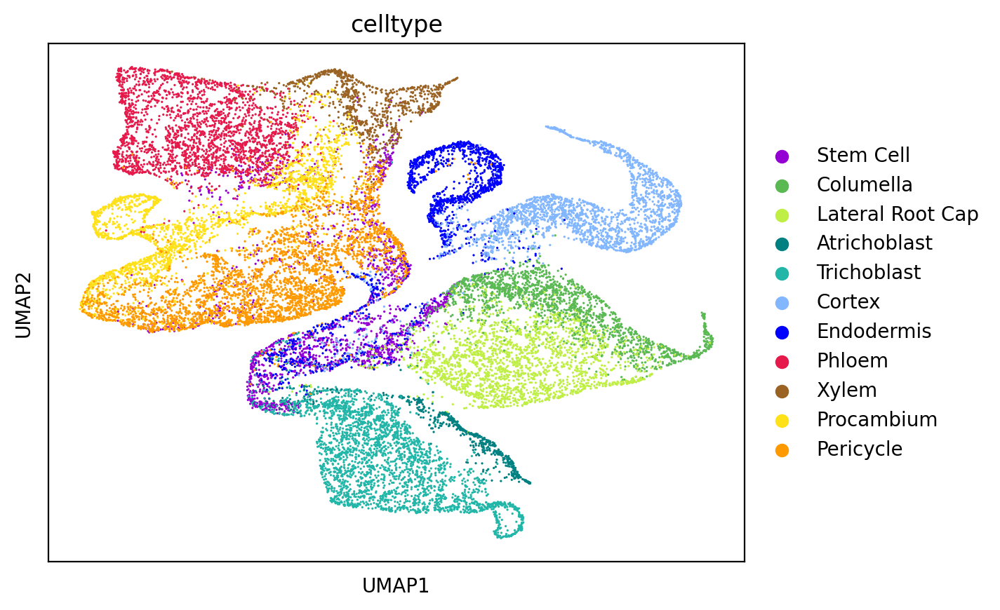

In [23]:
sc.pl.umap(adata, color=['celltype'])

In [24]:
adata.uns['timebin_colors'] = np.array([ '#5E4FA2', '#3288BD', '#66C2A5', '#ABDDA4', '#E6F598', '#FFFFBF', '#FEE08B', '#FDAE61', '#F46D43', '#D53E4F','#9E0142'])

/hpc/group/pbenfeylab/ch416/miniconda3/envs/pytorch-gpu/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


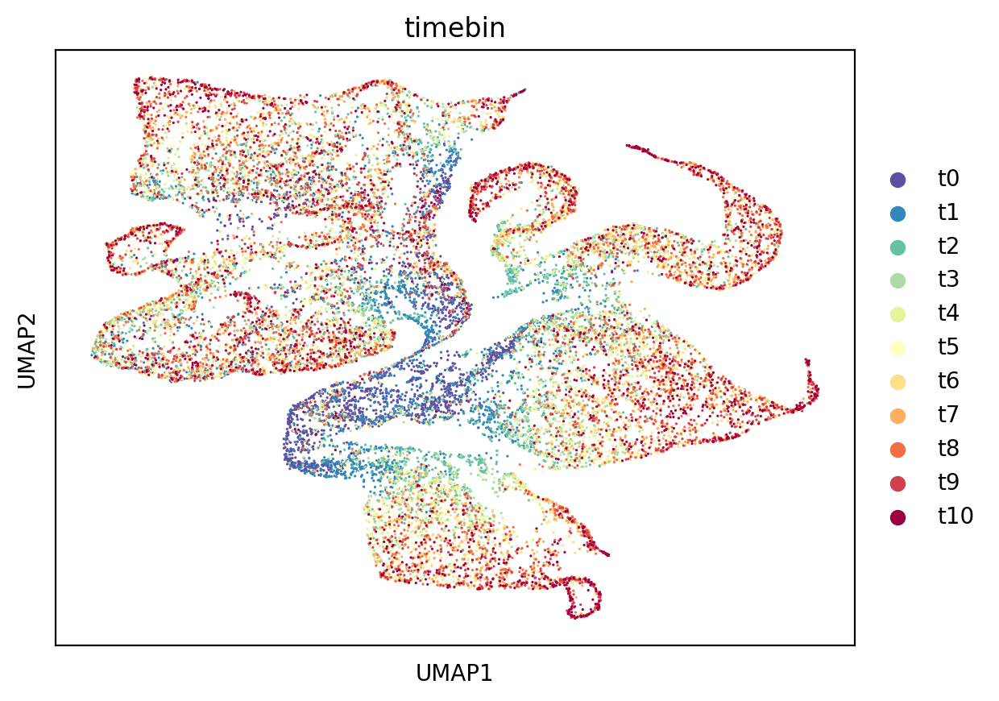

In [25]:
sc.pl.umap(adata, color=['timebin'])

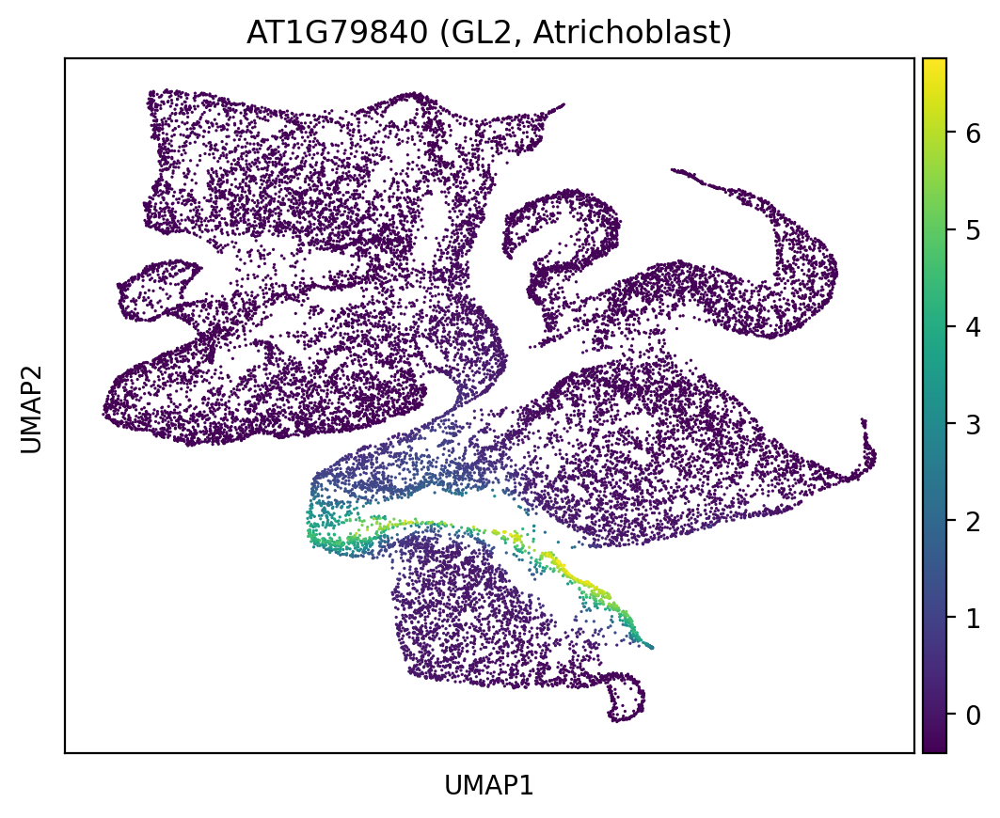

In [28]:
## AT1G79840
sc.pl.umap(adata, color='AT1G79840', title='AT1G79840 (GL2, Atrichoblast)')

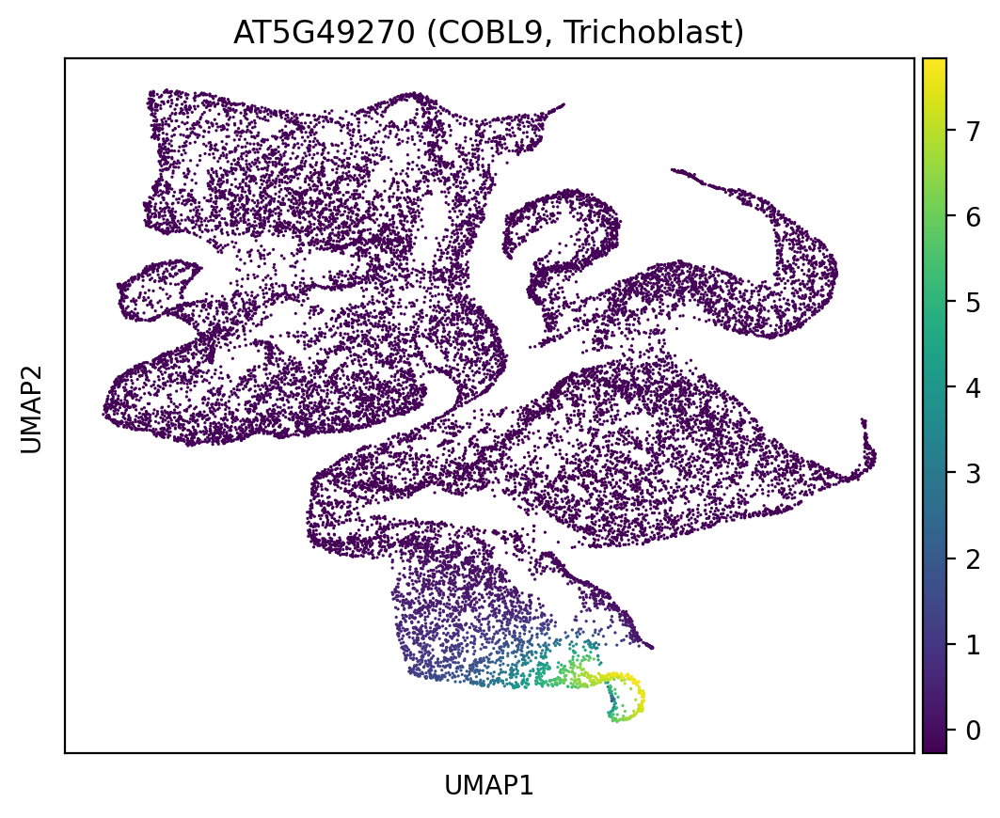

In [29]:
## AT5G49270
sc.pl.umap(adata, color='AT5G49270', title='AT5G49270 (COBL9, Trichoblast)')

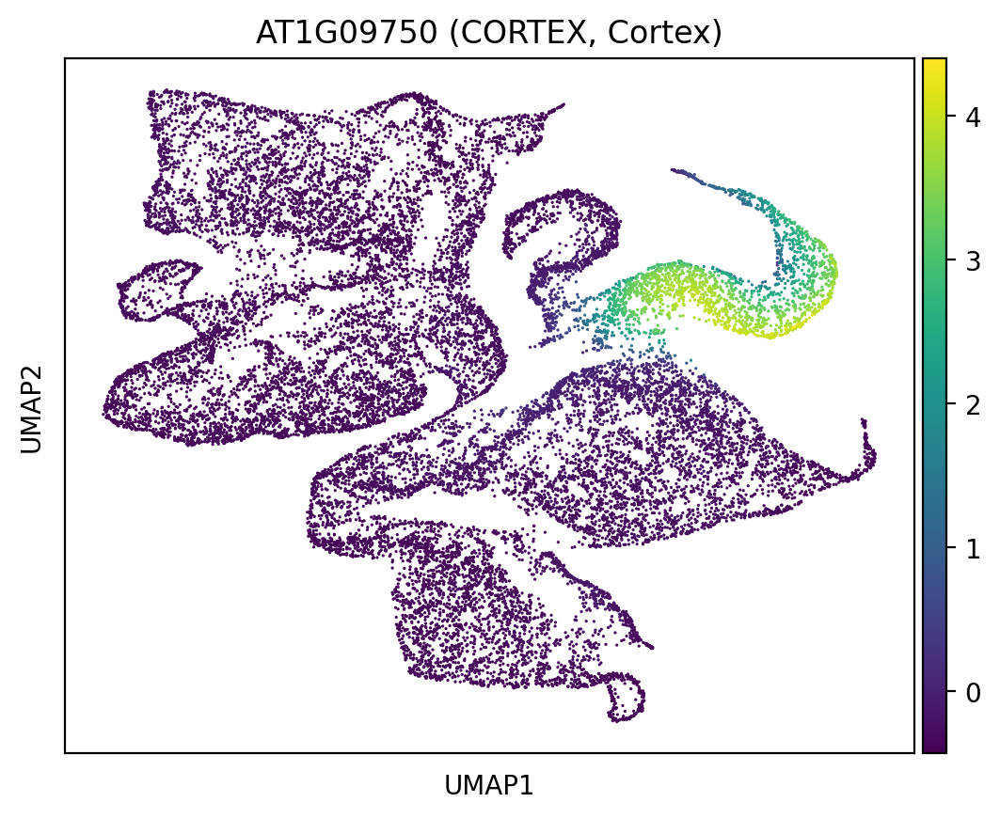

In [30]:
sc.pl.umap(adata, color='AT1G09750', title='AT1G09750 (CORTEX, Cortex)')

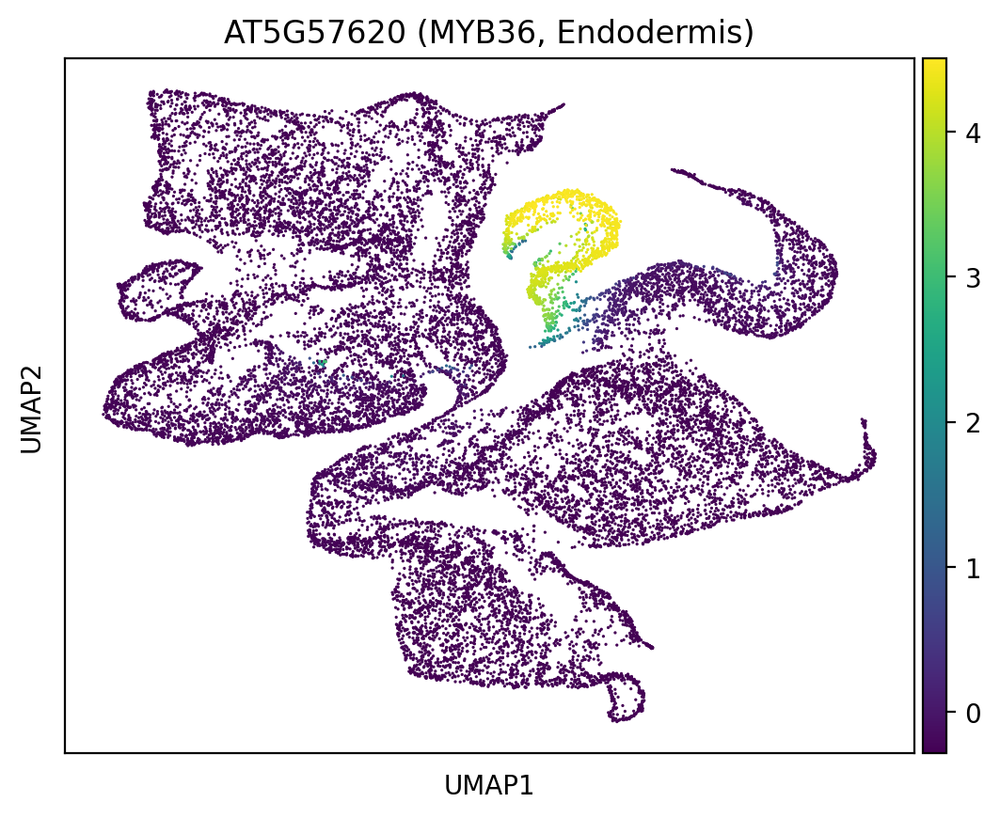

In [31]:
sc.pl.umap(adata, color='AT5G57620', title='AT5G57620 (MYB36, Endodermis)')

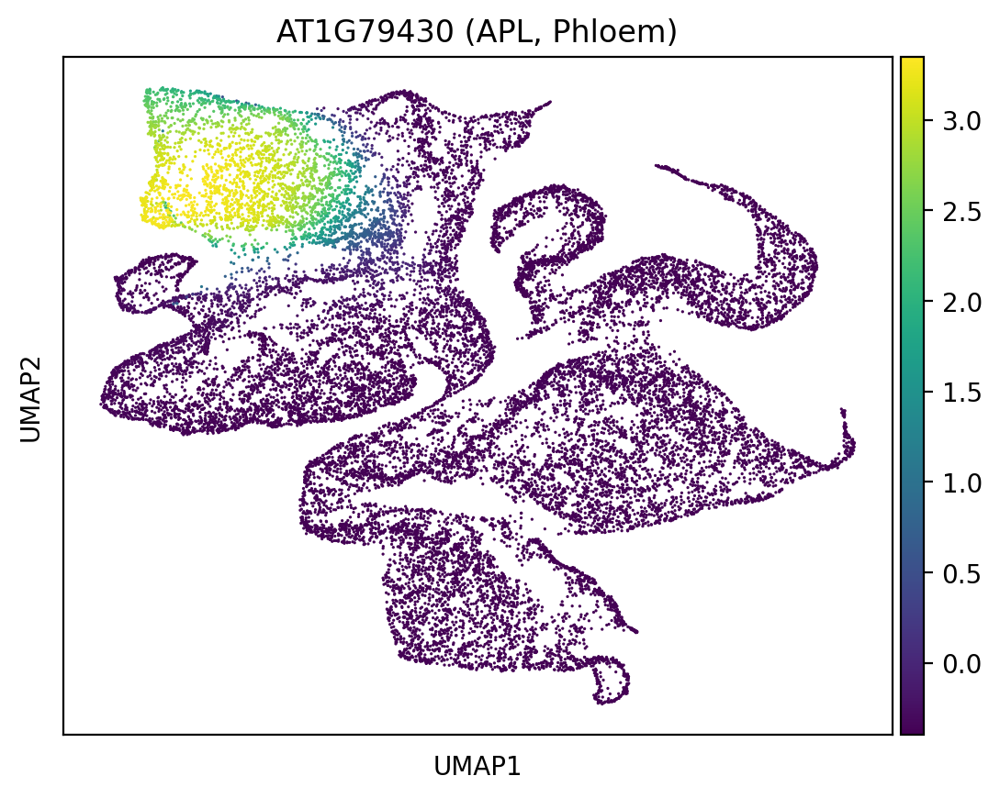

In [32]:
sc.pl.umap(adata, color='AT1G79430', title='AT1G79430 (APL, Phloem)')

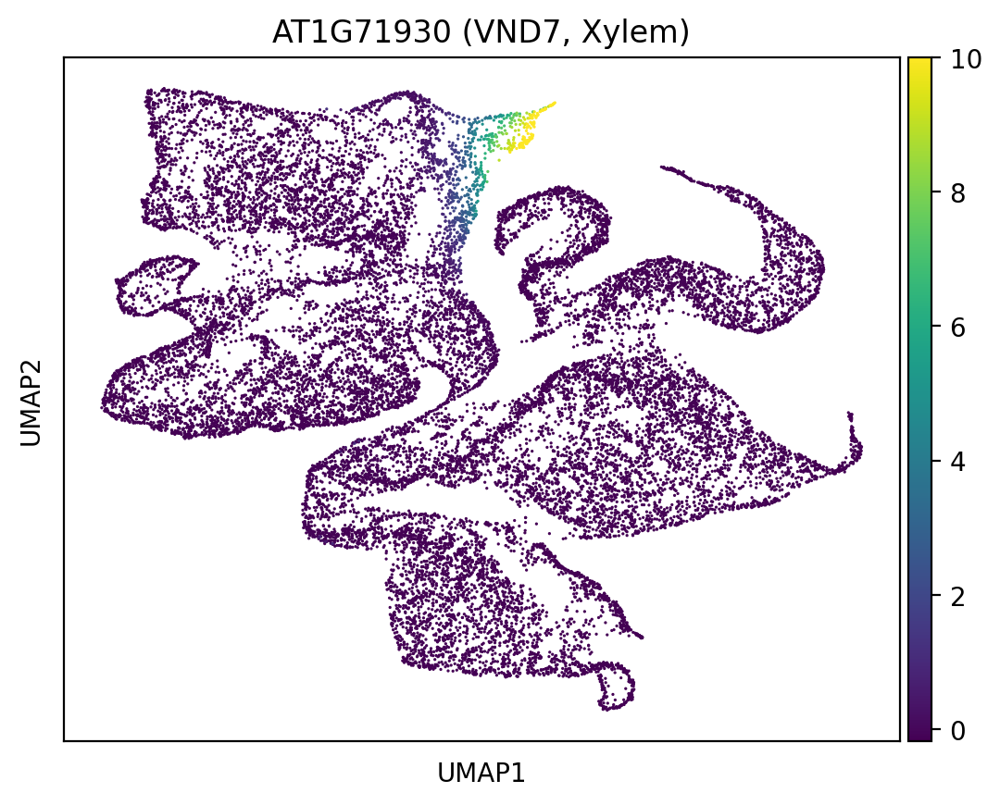

In [34]:
sc.pl.umap(adata, color='AT1G71930', title='AT1G71930 (VND7, Xylem)')

### Genes switched off for stem cell transitions

In [35]:
#Prepare 
xm = xo.clone()
# Genes switched off
xm.zero_()
## Provide entire tracks
x = torch.stack([xm[:,0,:],xm[:,1,:],xm[:,2,:],xm[:,2,:],xm[:,2,:],xm[:,2,:],xm[:,2,:],xm[:,2,:],xm[:,2,:],xm[:,2,:],xm[:,2,:]],dim=1)

In [36]:
## Initialize hidden state
pred_h = model.init_hidden(batch_size)

# t0 and t1 prediction based on data from the first two time points
t0 = model.generate_current(x, pred_h, 0)
t1 = model.generate_next(x, pred_h, 1)

## predict t1 label
y1, pred_h = model.predict_proba(x, pred_h, 1)
y1 = [num2class[i] for i in np.argmax(y1.cpu().detach().numpy(), axis=1)]

t2 = model.generate_next(x, pred_h, 2)
update_x = torch.stack([t0,t1,t2,t2,t2,t2,t2,t2,t2,t2,t2],dim=1)

y2, pred_h = model.predict_proba(update_x, pred_h, 2)
y2 = [num2class[i] for i in np.argmax(y2.cpu().detach().numpy(), axis=1)]

t3 = model.generate_next(update_x, pred_h, 3)
update_x = torch.stack([t0,t1,t2,t3,t3,t3,t3,t3,t3,t3,t3],dim=1)

y3, pred_h = model.predict_proba(update_x, pred_h, 3)
y3 = [num2class[i] for i in np.argmax(y3.cpu().detach().numpy(), axis=1)]

t4 = model.generate_next(update_x, pred_h, 4)
update_x = torch.stack([t0,t1,t2,t3,t4,t4,t4,t4,t4,t4,t4],dim=1)

y4, pred_h = model.predict_proba(update_x, pred_h, 4)
y4 = [num2class[i] for i in np.argmax(y4.cpu().detach().numpy(), axis=1)]

t5 = model.generate_next(update_x, pred_h, 5)
update_x = torch.stack([t0,t1,t2,t3,t4,t5,t5,t5,t5,t5,t5],dim=1)

y5, pred_h = model.predict_proba(update_x, pred_h, 5)
y5 = [num2class[i] for i in np.argmax(y5.cpu().detach().numpy(), axis=1)]

t6 = model.generate_next(update_x, pred_h, 6)
update_x = torch.stack([t0,t1,t2,t3,t4,t5,t6,t6,t6,t6,t6],dim=1)

y6, pred_h = model.predict_proba(update_x, pred_h, 6)
y6 = [num2class[i] for i in np.argmax(y6.cpu().detach().numpy(), axis=1)]

t7 = model.generate_next(update_x, pred_h, 7)
update_x = torch.stack([t0,t1,t2,t3,t4,t5,t6,t7,t7,t7,t7],dim=1)

y7, pred_h = model.predict_proba(update_x, pred_h, 7)
y7 = [num2class[i] for i in np.argmax(y7.cpu().detach().numpy(), axis=1)]

t8 = model.generate_next(update_x, pred_h, 8)
update_x = torch.stack([t0,t1,t2,t3,t4,t5,t6,t7,t8,t8,t8],dim=1)

y8, pred_h = model.predict_proba(update_x, pred_h, 8)
y8 = [num2class[i] for i in np.argmax(y8.cpu().detach().numpy(), axis=1)]

t9 = model.generate_next(update_x, pred_h, 9)
update_x = torch.stack([t0,t1,t2,t3,t4,t5,t6,t7,t8,t9,t9],dim=1)

y9, pred_h = model.predict_proba(update_x, pred_h, 9)
y9 = [num2class[i] for i in np.argmax(y9.cpu().detach().numpy(), axis=1)]

t10 = model.generate_next(update_x, pred_h, 10)
update_x = torch.stack([t0,t1,t2,t3,t4,t5,t6,t7,t8,t9,t10],dim=1)

y10, pred_h = model.predict_proba(update_x, pred_h, 10)
y10 = [num2class[i] for i in np.argmax(y10.cpu().detach().numpy(), axis=1)]

In [37]:
t0 = t0.to(device).detach().numpy()
t1 = t1.to(device).detach().numpy()
t2 = t2.to(device).detach().numpy()
t3 = t3.to(device).detach().numpy()
t4 = t4.to(device).detach().numpy()
t5 = t5.to(device).detach().numpy()
t6 = t6.to(device).detach().numpy()
t7 = t7.to(device).detach().numpy()
t8 = t8.to(device).detach().numpy()
t9 = t9.to(device).detach().numpy()
t10 = t10.to(device).detach().numpy()

In [38]:
pred_X = np.vstack((t0,t1,t2,t3,t4,t5,t6,t7,t8,t9,t10))
pred_Y = np.concatenate((['Stem Cell']*batch_size, y1, y2, y3, y4, y5, y6, y7, y8, y9, y10)).tolist()
#pred_Y = np.concatenate((['Stem Cell']*batch_size, ['Stem Cell']*batch_size, y2, y3, y4, y5, y6, y7, y8, y9, y10)).tolist()
pred_T = ['t0']*batch_size + ['t1']*batch_size + ['t2']*batch_size + ['t3']*batch_size + ['t4']*batch_size + ['t5']*batch_size + ['t6']*batch_size + ['t7']*batch_size + ['t8']*batch_size+ ['t9']*batch_size + ['t10']*batch_size

In [39]:
pd.DataFrame(pred_X).to_csv("./pred_X_WTswitchedoff02.csv", header=False)
pd.DataFrame(pred_Y).to_csv("./pred_Y_WTswitchedoff02.csv")
pd.DataFrame(pred_T).to_csv("./pred_T_WTswitchedoff02.csv")

In [40]:
adata = sc.read_csv('./pred_X_WTswitchedoff02.csv', first_column_names=True)
pred_Y = pd.read_csv('./pred_Y_WTswitchedoff02.csv')
pred_T = pd.read_csv('./pred_T_WTswitchedoff02.csv')
adata.obs['celltype'] = pred_Y['0'].tolist()
adata.obs['timebin'] = pred_T['0'].tolist()
adata.var.index = gene_list['features']

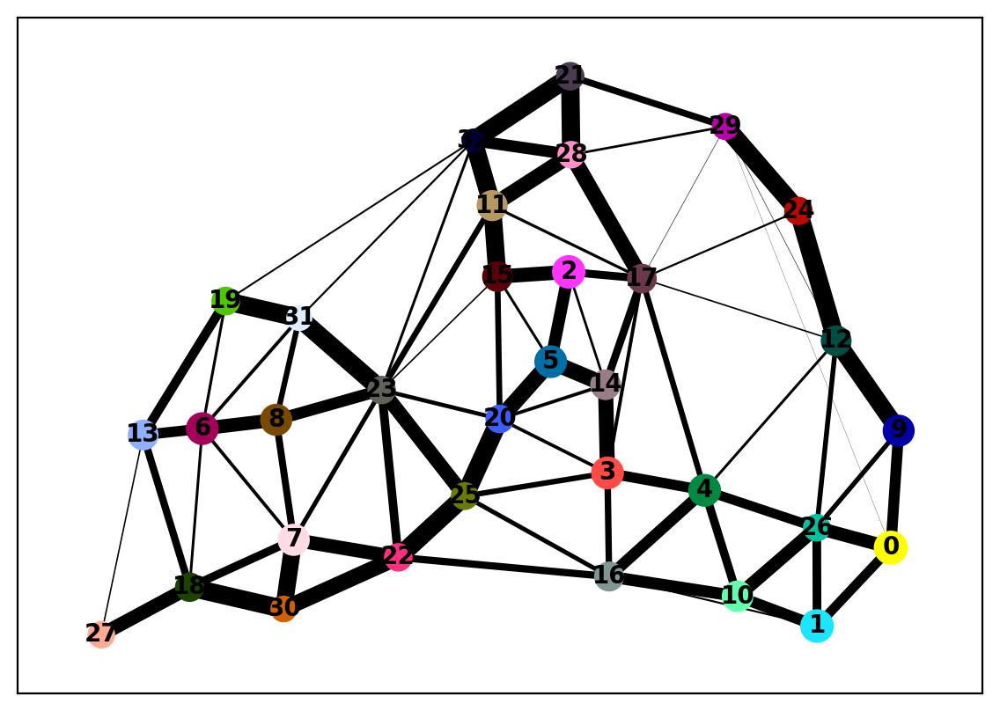

In [41]:
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=50)
sc.tl.leiden(adata)
sc.tl.paga(adata)
sc.pl.paga(adata) 

In [42]:
sc.tl.umap(adata, init_pos='paga')

In [43]:
adata.uns['celltype_colors'] = np.array([ "#9400d3","#5ab953", "#bfef45", "#008080", "#21B6A8", "#82b6ff", "#0000FF","#e6194b", "#9a6324", "#ffe119", "#ff9900", "#ffd4e3", "#9a6324", "#ddaa6f"], dtype=object)
adata.obs['celltype'] = pd.Categorical(adata.obs['celltype'], categories=["Stem Cell","Columella", "Lateral Root Cap", "Atrichoblast", "Trichoblast", "Cortex", "Endodermis", "Phloem", "Xylem", "Procambium","Pericycle"])

/hpc/group/pbenfeylab/ch416/miniconda3/envs/pytorch-gpu/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


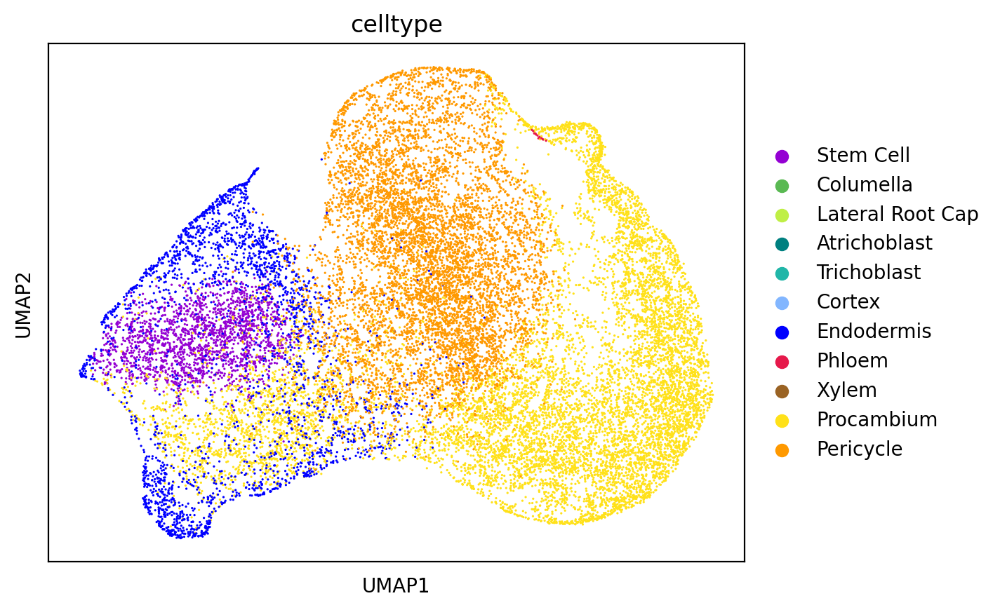

In [44]:
sc.pl.umap(adata, color=['celltype'])

In [45]:
adata.uns['timebin_colors'] = np.array([ '#5E4FA2', '#3288BD', '#66C2A5', '#ABDDA4', '#E6F598', '#FFFFBF', '#FEE08B', '#FDAE61', '#F46D43', '#D53E4F','#9E0142'])

/hpc/group/pbenfeylab/ch416/miniconda3/envs/pytorch-gpu/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


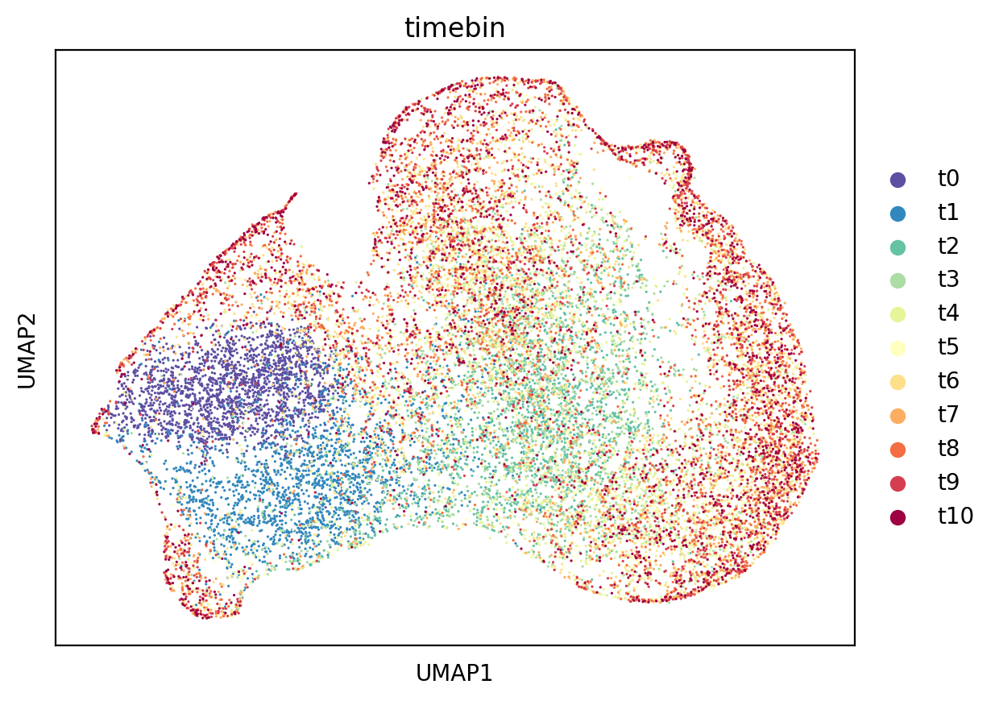

In [46]:
sc.pl.umap(adata, color=['timebin'])

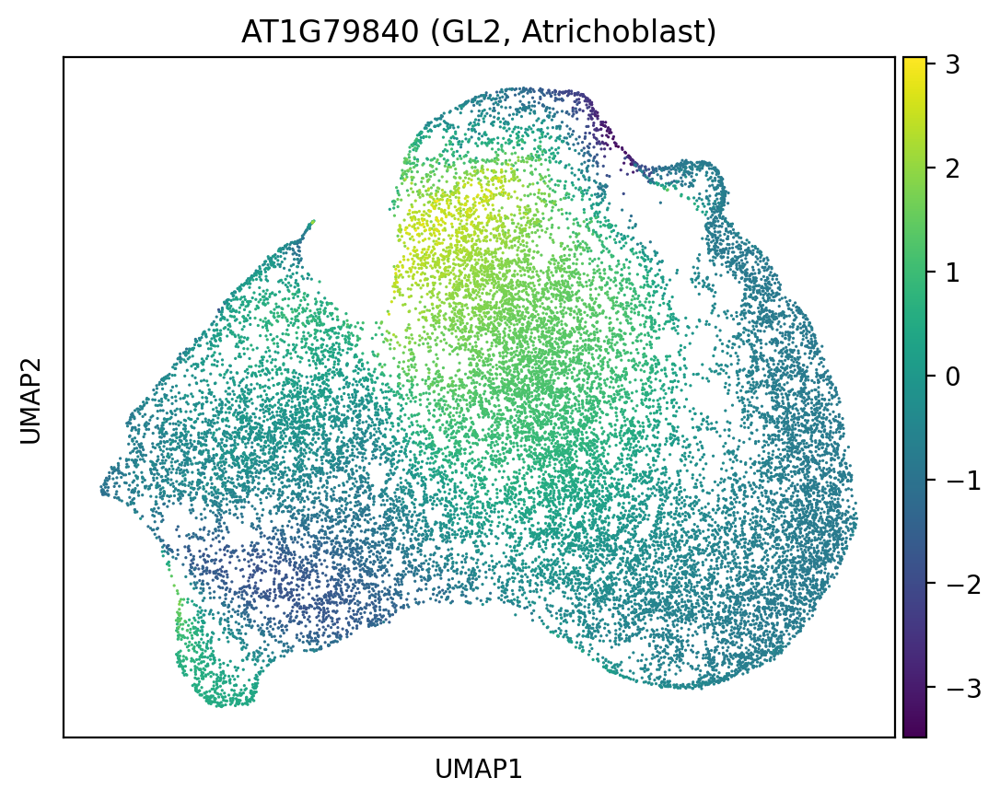

In [47]:
## AT1G79840
sc.pl.umap(adata, color='AT1G79840', title='AT1G79840 (GL2, Atrichoblast)')

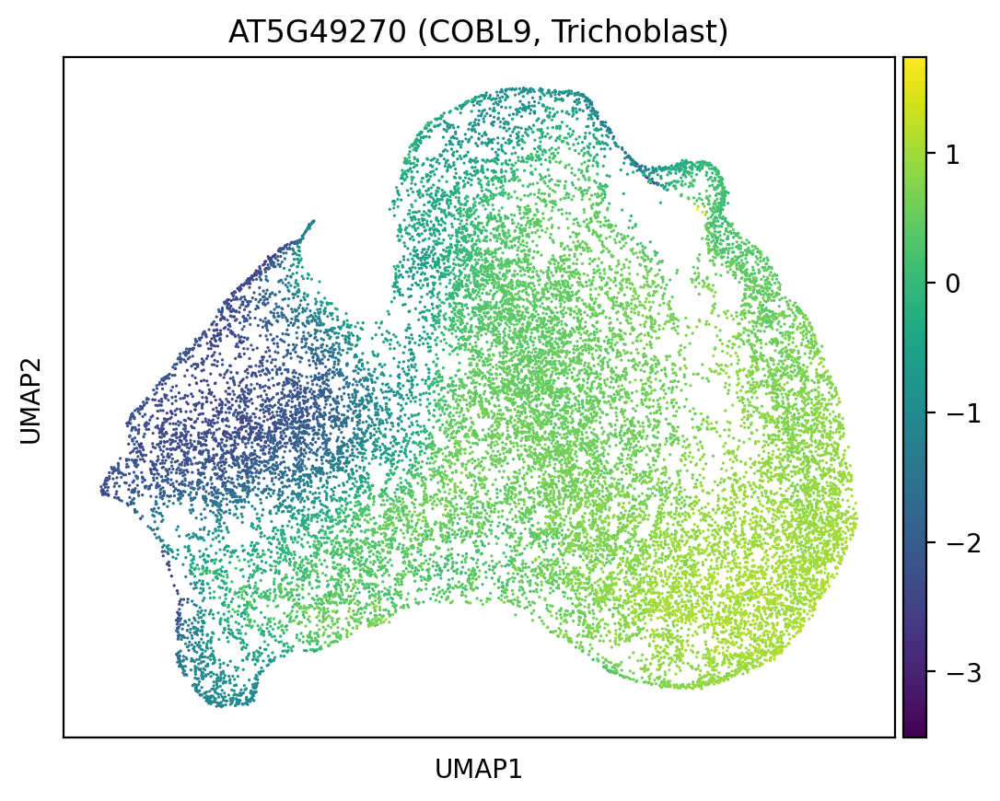

In [48]:
## AT5G49270
sc.pl.umap(adata, color='AT5G49270', title='AT5G49270 (COBL9, Trichoblast)')

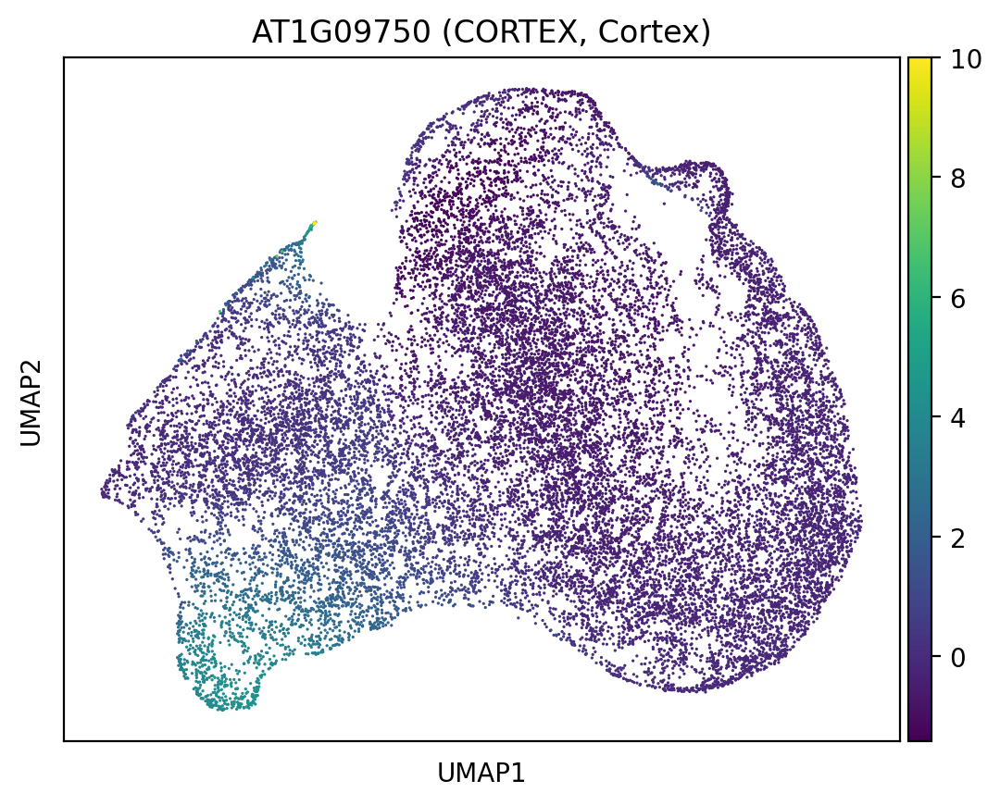

In [49]:
sc.pl.umap(adata, color='AT1G09750', title='AT1G09750 (CORTEX, Cortex)')

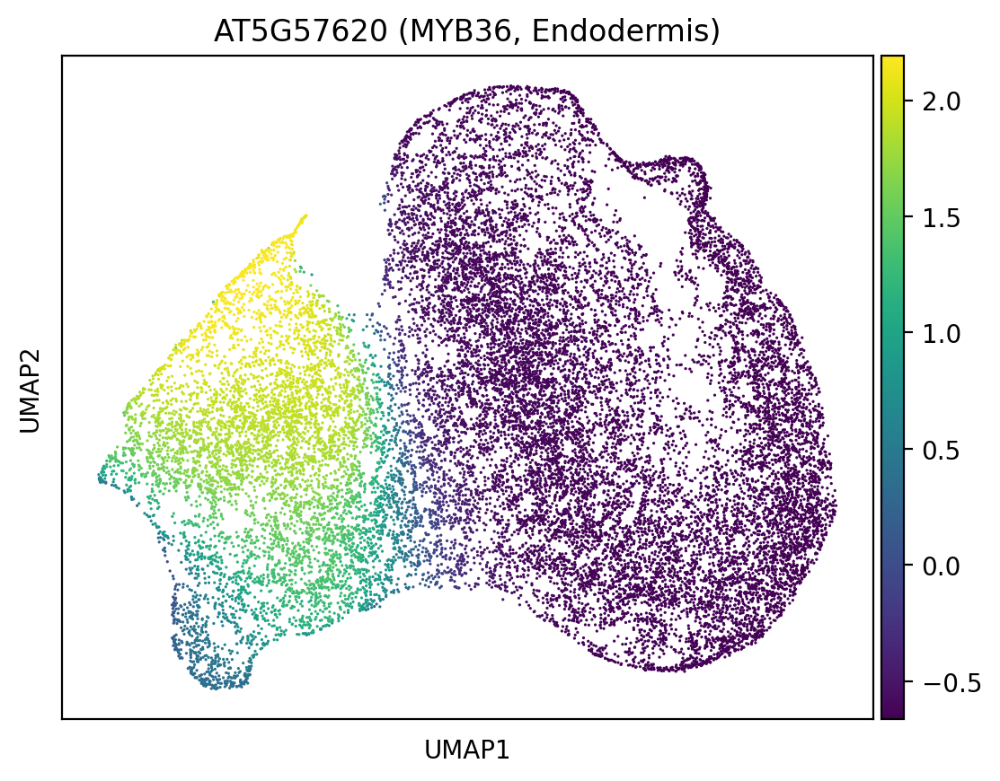

In [50]:
sc.pl.umap(adata, color='AT5G57620', title='AT5G57620 (MYB36, Endodermis)')

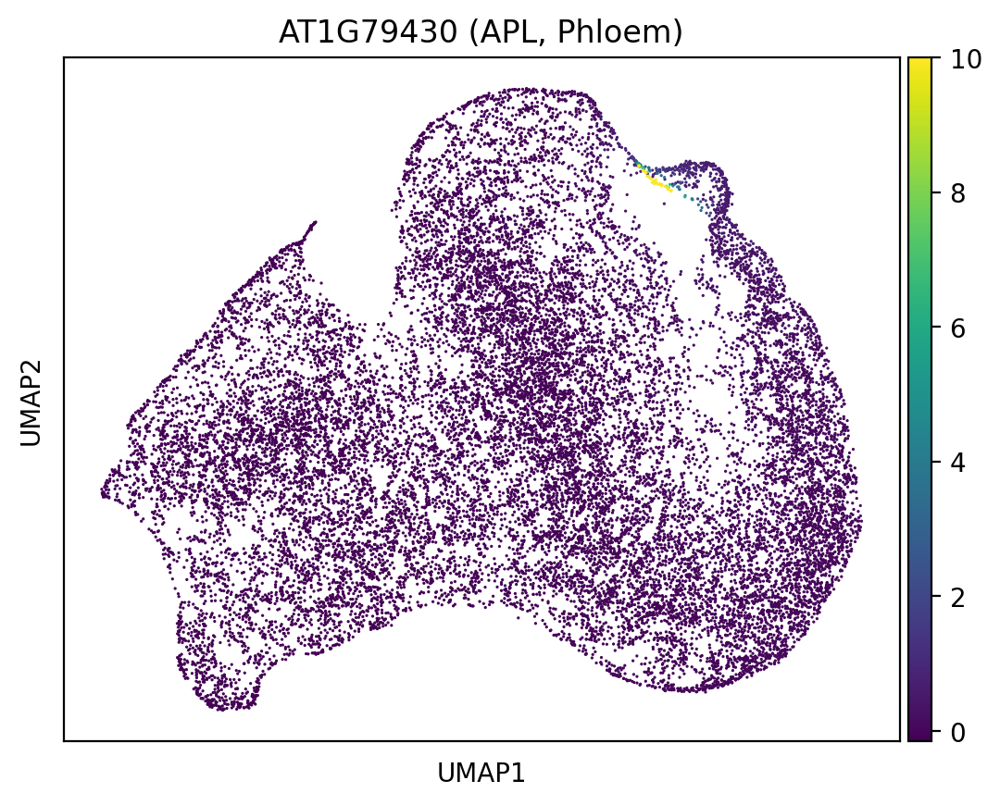

In [51]:
sc.pl.umap(adata, color='AT1G79430', title='AT1G79430 (APL, Phloem)')

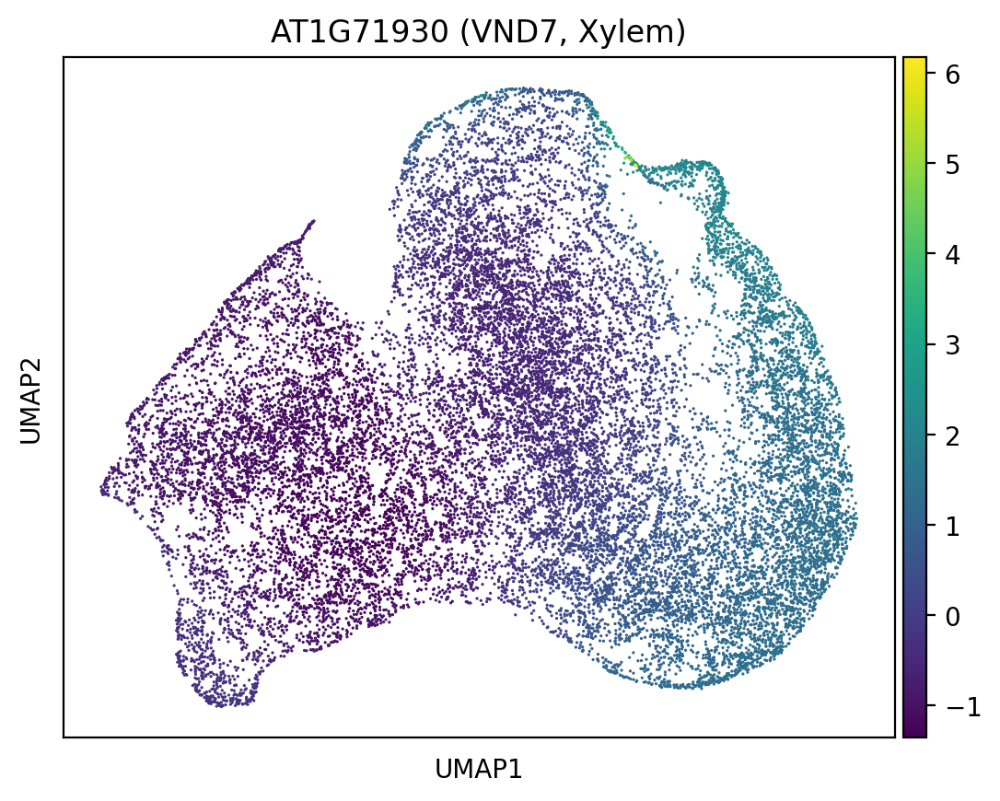

In [52]:
sc.pl.umap(adata, color='AT1G71930', title='AT1G71930 (VND7, Xylem)')

### Provide all time points

In [65]:
x = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,3,:],x[:,4,:],x[:,5,:],x[:,6,:],x[:,7,:],x[:,8,:],x[:,9,:],x[:,10,:]],dim=1)

In [66]:
## Initialize hidden state
pred_h = model.init_hidden(batch_size)

# t0 and t1 prediction based on data from the first two time points
t0 = model.generate_current(x, pred_h, 0)
t1 = model.generate_next(x, pred_h, 1)

## predict t1 label
y1, pred_h = model.predict_proba(x, pred_h, 1)
y1 = [num2class[i] for i in np.argmax(y1.cpu().detach().numpy(), axis=1)]

t2 = model.generate_next(x, pred_h, 2)

y2, pred_h = model.predict_proba(x, pred_h, 2)
y2 = [num2class[i] for i in np.argmax(y2.cpu().detach().numpy(), axis=1)]

t3 = model.generate_next(x, pred_h, 3)

y3, pred_h = model.predict_proba(x, pred_h, 3)
y3 = [num2class[i] for i in np.argmax(y3.cpu().detach().numpy(), axis=1)]

t4 = model.generate_next(x, pred_h, 4)

y4, pred_h = model.predict_proba(x, pred_h, 4)
y4 = [num2class[i] for i in np.argmax(y4.cpu().detach().numpy(), axis=1)]

t5 = model.generate_next(x, pred_h, 5)

y5, pred_h = model.predict_proba(x, pred_h, 5)
y5 = [num2class[i] for i in np.argmax(y5.cpu().detach().numpy(), axis=1)]

t6 = model.generate_next(x, pred_h, 6)

y6, pred_h = model.predict_proba(x, pred_h, 6)
y6 = [num2class[i] for i in np.argmax(y6.cpu().detach().numpy(), axis=1)]

t7 = model.generate_next(x, pred_h, 7)

y7, pred_h = model.predict_proba(x, pred_h, 7)
y7 = [num2class[i] for i in np.argmax(y7.cpu().detach().numpy(), axis=1)]

t8 = model.generate_next(x, pred_h, 8)

y8, pred_h = model.predict_proba(x, pred_h, 8)
y8 = [num2class[i] for i in np.argmax(y8.cpu().detach().numpy(), axis=1)]

t9 = model.generate_next(x, pred_h, 9)

y9, pred_h = model.predict_proba(x, pred_h, 9)
y9 = [num2class[i] for i in np.argmax(y9.cpu().detach().numpy(), axis=1)]

t10 = model.generate_next(x, pred_h, 10)

y10, pred_h = model.predict_proba(x, pred_h, 10)
y10 = [num2class[i] for i in np.argmax(y10.cpu().detach().numpy(), axis=1)]

In [67]:
t0 = t0.to(device).detach().numpy()
t1 = t1.to(device).detach().numpy()
t2 = t2.to(device).detach().numpy()
t3 = t3.to(device).detach().numpy()
t4 = t4.to(device).detach().numpy()
t5 = t5.to(device).detach().numpy()
t6 = t6.to(device).detach().numpy()
t7 = t7.to(device).detach().numpy()
t8 = t8.to(device).detach().numpy()
t9 = t9.to(device).detach().numpy()
t10 = t10.to(device).detach().numpy()

In [68]:
pred_X = np.vstack((t0,t1,t2,t3,t4,t5,t6,t7,t8,t9,t10))
pred_Y = np.concatenate((['Stem Cell']*batch_size, y1, y2, y3, y4, y5, y6, y7, y8, y9, y10)).tolist()
#pred_Y = np.concatenate((['Stem Cell']*batch_size, ['Stem Cell']*batch_size, y2, y3, y4, y5, y6, y7, y8, y9, y10)).tolist()
pred_T = ['t0']*batch_size + ['t1']*batch_size + ['t2']*batch_size + ['t3']*batch_size + ['t4']*batch_size + ['t5']*batch_size + ['t6']*batch_size + ['t7']*batch_size + ['t8']*batch_size+ ['t9']*batch_size + ['t10']*batch_size

In [69]:
pd.DataFrame(pred_X).to_csv("./pred_X_WT.csv", header=False)
pd.DataFrame(pred_Y).to_csv("./pred_Y_WT.csv")
pd.DataFrame(pred_T).to_csv("./pred_T_WT.csv")

In [70]:
adata = sc.read_csv('./pred_X_WT.csv', first_column_names=True)
pred_Y = pd.read_csv('./pred_Y_WT.csv')
pred_T = pd.read_csv('./pred_T_WT.csv')
adata.obs['celltype'] = pred_Y['0'].tolist()
adata.obs['timebin'] = pred_T['0'].tolist()
adata.var.index = gene_list['features']

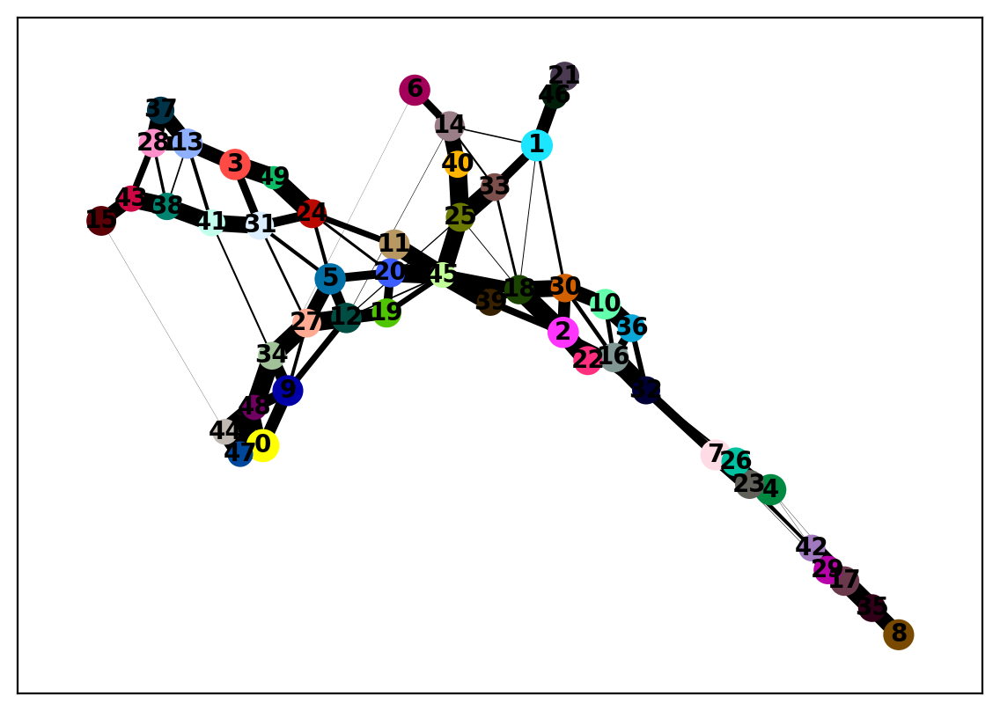

In [71]:
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=50)
sc.tl.leiden(adata)
sc.tl.paga(adata)
sc.pl.paga(adata)

In [72]:
sc.tl.umap(adata, init_pos='paga')

In [73]:
adata.uns['celltype_colors'] = np.array([ "#9400d3","#5ab953", "#bfef45", "#008080", "#21B6A8", "#82b6ff", "#0000FF","#e6194b", "#9a6324", "#ffe119", "#ff9900", "#ffd4e3", "#9a6324", "#ddaa6f"], dtype=object)
adata.obs['celltype'] = pd.Categorical(adata.obs['celltype'], categories=["Stem Cell","Columella", "Lateral Root Cap", "Atrichoblast", "Trichoblast", "Cortex", "Endodermis", "Phloem", "Xylem", "Procambium","Pericycle"])

/hpc/group/pbenfeylab/ch416/miniconda3/envs/pytorch-gpu/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


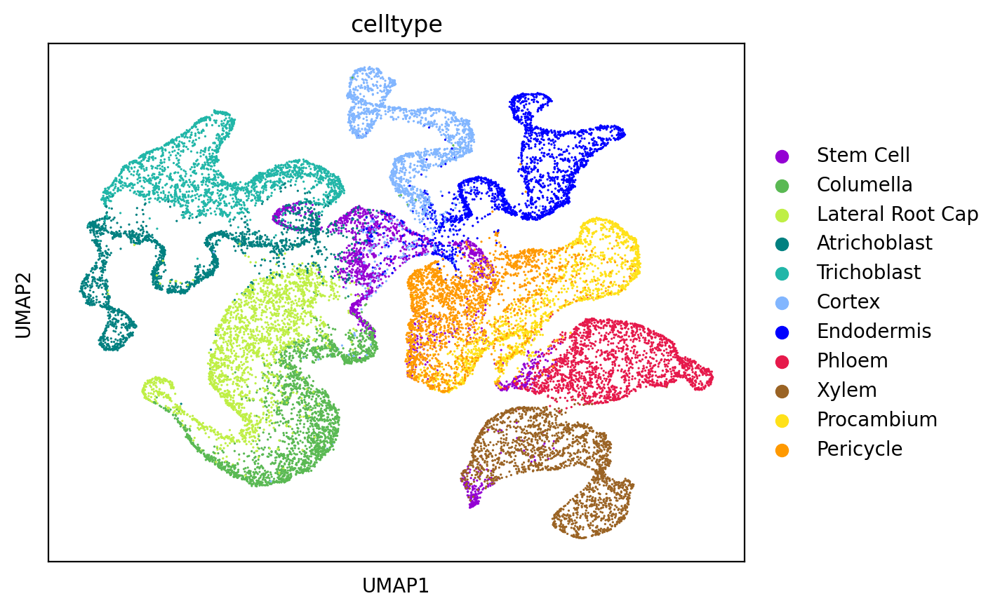

In [74]:
sc.pl.umap(adata, color=['celltype'])

In [75]:
adata.uns['timebin_colors'] = np.array([ '#5E4FA2', '#3288BD', '#66C2A5', '#ABDDA4', '#E6F598', '#FFFFBF', '#FEE08B', '#FDAE61', '#F46D43', '#D53E4F','#9E0142'])

/hpc/group/pbenfeylab/ch416/miniconda3/envs/pytorch-gpu/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


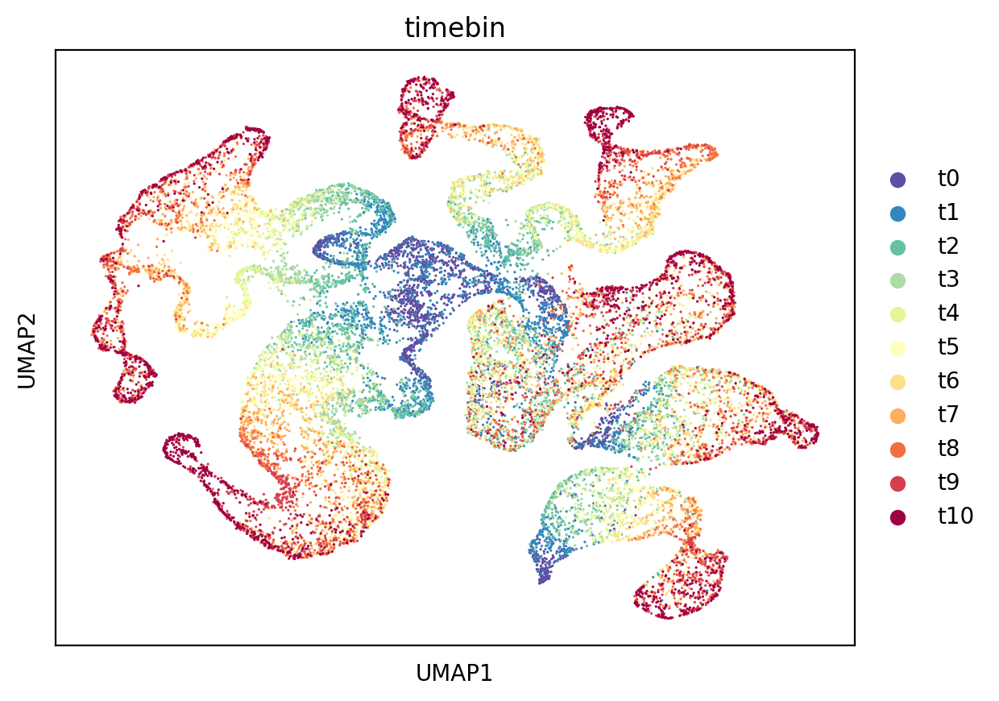

In [76]:
sc.pl.umap(adata, color=['timebin'])

### Recreation accuracy

In [30]:
y_pred1, y_pred2, y_pred3, y_pred4, y_pred5, y_pred6, y_pred7, y_pred8, y_pred9, y_pred10, y_true = [], [], [], [], [], [], [], [], [], [], []
with torch.no_grad():
    for sample in loader:
        x = sample['x'].to(device)
        x0 = torch.stack([x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:]],dim=1)
        x1 = torch.stack([x[:,0,:],x[:,1,:],x[:,1,:],x[:,1,:],x[:,1,:],x[:,1,:],x[:,1,:],x[:,1,:],x[:,1,:],x[:,1,:],x[:,1,:]],dim=1)
        x2 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,2,:],x[:,2,:],x[:,2,:],x[:,2,:],x[:,2,:],x[:,2,:],x[:,2,:],x[:,2,:]],dim=1)
        x3 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,3,:],x[:,3,:],x[:,3,:],x[:,3,:],x[:,3,:],x[:,3,:],x[:,3,:],x[:,3,:]],dim=1)
        x4 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,3,:],x[:,4,:],x[:,4,:],x[:,4,:],x[:,4,:],x[:,4,:],x[:,4,:],x[:,4,:]],dim=1)
        x5 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,3,:],x[:,4,:],x[:,5,:],x[:,5,:],x[:,5,:],x[:,5,:],x[:,5,:],x[:,5,:]],dim=1)
        x6 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,3,:],x[:,4,:],x[:,5,:],x[:,6,:],x[:,6,:],x[:,6,:],x[:,6,:],x[:,6,:]],dim=1)
        x7 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,3,:],x[:,4,:],x[:,5,:],x[:,6,:],x[:,7,:],x[:,7,:],x[:,7,:],x[:,7,:]],dim=1)
        x8 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,3,:],x[:,4,:],x[:,5,:],x[:,6,:],x[:,7,:],x[:,8,:],x[:,8,:],x[:,8,:]],dim=1)
        x9 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,3,:],x[:,4,:],x[:,5,:],x[:,6,:],x[:,7,:],x[:,8,:],x[:,9,:],x[:,9,:]],dim=1)
        y = sample['y'].to(device)
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x0, test_h, 1)
        y_pred1.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x1, test_h, 2)
        y_pred2.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x2, test_h, 3)
        y_pred3.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x3, test_h, 4)
        y_pred4.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x4, test_h, 5)
        y_pred5.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x5, test_h, 6)
        y_pred6.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x6, test_h, 7)
        y_pred7.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x7, test_h, 8)
        y_pred8.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x8, test_h, 9)
        y_pred9.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x9, test_h, 10)
        y_pred10.append(p.cpu().detach().numpy())
        y_true.append(y.cpu().detach().numpy())
        
y_pred1 = np.concatenate(y_pred1)
y_pred2 = np.concatenate(y_pred2)
y_pred3 = np.concatenate(y_pred3)
y_pred4 = np.concatenate(y_pred4)
y_pred5 = np.concatenate(y_pred5)
y_pred6 = np.concatenate(y_pred6)
y_pred7 = np.concatenate(y_pred7)
y_pred8 = np.concatenate(y_pred8)
y_pred9 = np.concatenate(y_pred9)
y_pred10 = np.concatenate(y_pred10)
y_true = np.concatenate(y_true)     

In [31]:
test_acc = []
test_acc.append((y_true == np.argmax(y_pred1, axis=1)).mean()) 
test_acc.append((y_true == np.argmax(y_pred2, axis=1)).mean()) 
test_acc.append((y_true == np.argmax(y_pred3, axis=1)).mean()) 
test_acc.append((y_true == np.argmax(y_pred4, axis=1)).mean()) 
test_acc.append((y_true == np.argmax(y_pred5, axis=1)).mean()) 
test_acc.append((y_true == np.argmax(y_pred6, axis=1)).mean()) 
test_acc.append((y_true == np.argmax(y_pred7, axis=1)).mean()) 
test_acc.append((y_true == np.argmax(y_pred8, axis=1)).mean()) 
test_acc.append((y_true == np.argmax(y_pred9, axis=1)).mean()) 
test_acc.append((y_true == np.argmax(y_pred10, axis=1)).mean()) 

In [ ]:
y_pred1, y_pred2, y_pred3, y_pred4, y_pred5, y_pred6, y_pred7, y_pred8, y_pred9, y_pred10, y_true = [], [], [], [], [], [], [], [], [], [], []
with torch.no_grad():
    for sample in train_loader:
        x = sample['x'].to(device)
        x0 = torch.stack([x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:]],dim=1)
        x1 = torch.stack([x[:,0,:],x[:,1,:],x[:,1,:],x[:,1,:],x[:,1,:],x[:,1,:],x[:,1,:],x[:,1,:],x[:,1,:],x[:,1,:],x[:,1,:]],dim=1)
        x2 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,2,:],x[:,2,:],x[:,2,:],x[:,2,:],x[:,2,:],x[:,2,:],x[:,2,:],x[:,2,:]],dim=1)
        x3 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,3,:],x[:,3,:],x[:,3,:],x[:,3,:],x[:,3,:],x[:,3,:],x[:,3,:],x[:,3,:]],dim=1)
        x4 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,3,:],x[:,4,:],x[:,4,:],x[:,4,:],x[:,4,:],x[:,4,:],x[:,4,:],x[:,4,:]],dim=1)
        x5 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,3,:],x[:,4,:],x[:,5,:],x[:,5,:],x[:,5,:],x[:,5,:],x[:,5,:],x[:,5,:]],dim=1)
        x6 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,3,:],x[:,4,:],x[:,5,:],x[:,6,:],x[:,6,:],x[:,6,:],x[:,6,:],x[:,6,:]],dim=1)
        x7 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,3,:],x[:,4,:],x[:,5,:],x[:,6,:],x[:,7,:],x[:,7,:],x[:,7,:],x[:,7,:]],dim=1)
        x8 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,3,:],x[:,4,:],x[:,5,:],x[:,6,:],x[:,7,:],x[:,8,:],x[:,8,:],x[:,8,:]],dim=1)
        x9 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,3,:],x[:,4,:],x[:,5,:],x[:,6,:],x[:,7,:],x[:,8,:],x[:,9,:],x[:,9,:]],dim=1)
        y = sample['y'].to(device)
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x0, test_h, 1)
        y_pred1.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x1, test_h, 2)
        y_pred2.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x2, test_h, 3)
        y_pred3.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x3, test_h, 4)
        y_pred4.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x4, test_h, 5)
        y_pred5.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x5, test_h, 6)
        y_pred6.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x6, test_h, 7)
        y_pred7.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x7, test_h, 8)
        y_pred8.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x8, test_h, 9)
        y_pred9.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x9, test_h, 10)
        y_pred10.append(p.cpu().detach().numpy())
        y_true.append(y.cpu().detach().numpy())
        
y_pred1 = np.concatenate(y_pred1)
y_pred2 = np.concatenate(y_pred2)
y_pred3 = np.concatenate(y_pred3)
y_pred4 = np.concatenate(y_pred4)
y_pred5 = np.concatenate(y_pred5)
y_pred6 = np.concatenate(y_pred6)
y_pred7 = np.concatenate(y_pred7)
y_pred8 = np.concatenate(y_pred8)
y_pred9 = np.concatenate(y_pred9)
y_pred10 = np.concatenate(y_pred10)
y_true = np.concatenate(y_true)     

In [ ]:
test_acc2 = []
test_acc2.append((y_true == np.argmax(y_pred1, axis=1)).mean()) 
test_acc2.append((y_true == np.argmax(y_pred2, axis=1)).mean()) 
test_acc2.append((y_true == np.argmax(y_pred3, axis=1)).mean()) 
test_acc2.append((y_true == np.argmax(y_pred4, axis=1)).mean()) 
test_acc2.append((y_true == np.argmax(y_pred5, axis=1)).mean()) 
test_acc2.append((y_true == np.argmax(y_pred6, axis=1)).mean()) 
test_acc2.append((y_true == np.argmax(y_pred7, axis=1)).mean()) 
test_acc2.append((y_true == np.argmax(y_pred8, axis=1)).mean()) 
test_acc2.append((y_true == np.argmax(y_pred9, axis=1)).mean()) 
test_acc2.append((y_true == np.argmax(y_pred10, axis=1)).mean()) 

In [34]:
y_pred1, y_pred2, y_pred3, y_pred4, y_pred5, y_pred6, y_pred7, y_pred8, y_pred9, y_pred10, y_true = [], [], [], [], [], [], [], [], [], [], []
with torch.no_grad():
    for sample in unseen_loader:
        x = sample['x'].to(device)
        x0 = torch.stack([x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:]],dim=1)
        x1 = torch.stack([x[:,0,:],x[:,1,:],x[:,1,:],x[:,1,:],x[:,1,:],x[:,1,:],x[:,1,:],x[:,1,:],x[:,1,:],x[:,1,:],x[:,1,:]],dim=1)
        x2 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,2,:],x[:,2,:],x[:,2,:],x[:,2,:],x[:,2,:],x[:,2,:],x[:,2,:],x[:,2,:]],dim=1)
        x3 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,3,:],x[:,3,:],x[:,3,:],x[:,3,:],x[:,3,:],x[:,3,:],x[:,3,:],x[:,3,:]],dim=1)
        x4 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,3,:],x[:,4,:],x[:,4,:],x[:,4,:],x[:,4,:],x[:,4,:],x[:,4,:],x[:,4,:]],dim=1)
        x5 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,3,:],x[:,4,:],x[:,5,:],x[:,5,:],x[:,5,:],x[:,5,:],x[:,5,:],x[:,5,:]],dim=1)
        x6 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,3,:],x[:,4,:],x[:,5,:],x[:,6,:],x[:,6,:],x[:,6,:],x[:,6,:],x[:,6,:]],dim=1)
        x7 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,3,:],x[:,4,:],x[:,5,:],x[:,6,:],x[:,7,:],x[:,7,:],x[:,7,:],x[:,7,:]],dim=1)
        x8 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,3,:],x[:,4,:],x[:,5,:],x[:,6,:],x[:,7,:],x[:,8,:],x[:,8,:],x[:,8,:]],dim=1)
        x9 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,3,:],x[:,4,:],x[:,5,:],x[:,6,:],x[:,7,:],x[:,8,:],x[:,9,:],x[:,9,:]],dim=1)
        y = sample['y'].to(device)
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x0, test_h, 1)
        y_pred1.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x1, test_h, 2)
        y_pred2.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x2, test_h, 3)
        y_pred3.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x3, test_h, 4)
        y_pred4.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x4, test_h, 5)
        y_pred5.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x5, test_h, 6)
        y_pred6.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x6, test_h, 7)
        y_pred7.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x7, test_h, 8)
        y_pred8.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x8, test_h, 9)
        y_pred9.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x9, test_h, 10)
        y_pred10.append(p.cpu().detach().numpy())
        y_true.append(y.cpu().detach().numpy())
        
y_pred1 = np.concatenate(y_pred1)
y_pred2 = np.concatenate(y_pred2)
y_pred3 = np.concatenate(y_pred3)
y_pred4 = np.concatenate(y_pred4)
y_pred5 = np.concatenate(y_pred5)
y_pred6 = np.concatenate(y_pred6)
y_pred7 = np.concatenate(y_pred7)
y_pred8 = np.concatenate(y_pred8)
y_pred9 = np.concatenate(y_pred9)
y_pred10 = np.concatenate(y_pred10)
y_true = np.concatenate(y_true)     

In [35]:
test_acc3 = []
test_acc3.append((y_true == np.argmax(y_pred1, axis=1)).mean()) 
test_acc3.append((y_true == np.argmax(y_pred2, axis=1)).mean()) 
test_acc3.append((y_true == np.argmax(y_pred3, axis=1)).mean()) 
test_acc3.append((y_true == np.argmax(y_pred4, axis=1)).mean()) 
test_acc3.append((y_true == np.argmax(y_pred5, axis=1)).mean()) 
test_acc3.append((y_true == np.argmax(y_pred6, axis=1)).mean()) 
test_acc3.append((y_true == np.argmax(y_pred7, axis=1)).mean()) 
test_acc3.append((y_true == np.argmax(y_pred8, axis=1)).mean()) 
test_acc3.append((y_true == np.argmax(y_pred9, axis=1)).mean()) 
test_acc3.append((y_true == np.argmax(y_pred10, axis=1)).mean()) 

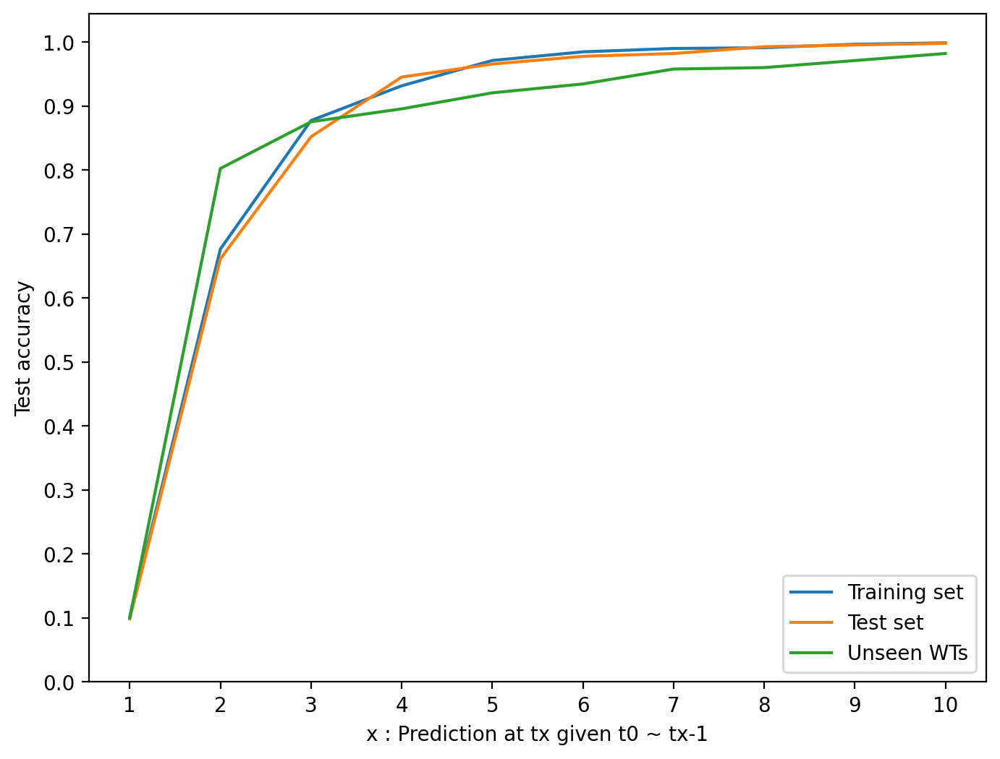

In [39]:
time = [1,2,3,4,5,6,7,8,9,10]
figure(figsize=(8, 6), dpi=100)
plt.plot(time, test_acc2, label="Training set")
plt.plot(time, test_acc, label="Test set")
plt.plot(time, test_acc3, label="Unseen WTs")
plt.xlabel('x : Prediction at tx given t0 ~ tx-1')
plt.ylabel('Test accuracy')
plt.xticks(np.arange(1, 11, 1.0))
plt.yticks(np.arange(0, 1.1, 0.1))
plt.legend(loc='lower right')

In [47]:
## Determine genes to mutate
gtm = 'AT4G37650'
gtmidx = gene_list.index[gene_list['features']=='AT4G37650'][0]

In [48]:
y_pred1, y_pred2, y_pred3, y_pred4, y_pred5, y_pred6, y_pred7, y_pred8, y_pred9, y_pred10, y_true = [], [], [], [], [], [], [], [], [], [], []
with torch.no_grad():
    for sample in loader:
        x = sample['x'].to(device)
        ## mutate the genes
        x[:,:,gtmidx].zero_()
        x0 = torch.stack([x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:],x[:,0,:]],dim=1)
        x1 = torch.stack([x[:,0,:],x[:,1,:],x[:,1,:],x[:,1,:],x[:,1,:],x[:,1,:],x[:,1,:],x[:,1,:],x[:,1,:],x[:,1,:],x[:,1,:]],dim=1)
        x2 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,2,:],x[:,2,:],x[:,2,:],x[:,2,:],x[:,2,:],x[:,2,:],x[:,2,:],x[:,2,:]],dim=1)
        x3 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,3,:],x[:,3,:],x[:,3,:],x[:,3,:],x[:,3,:],x[:,3,:],x[:,3,:],x[:,3,:]],dim=1)
        x4 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,3,:],x[:,4,:],x[:,4,:],x[:,4,:],x[:,4,:],x[:,4,:],x[:,4,:],x[:,4,:]],dim=1)
        x5 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,3,:],x[:,4,:],x[:,5,:],x[:,5,:],x[:,5,:],x[:,5,:],x[:,5,:],x[:,5,:]],dim=1)
        x6 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,3,:],x[:,4,:],x[:,5,:],x[:,6,:],x[:,6,:],x[:,6,:],x[:,6,:],x[:,6,:]],dim=1)
        x7 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,3,:],x[:,4,:],x[:,5,:],x[:,6,:],x[:,7,:],x[:,7,:],x[:,7,:],x[:,7,:]],dim=1)
        x8 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,3,:],x[:,4,:],x[:,5,:],x[:,6,:],x[:,7,:],x[:,8,:],x[:,8,:],x[:,8,:]],dim=1)
        x9 = torch.stack([x[:,0,:],x[:,1,:],x[:,2,:],x[:,3,:],x[:,4,:],x[:,5,:],x[:,6,:],x[:,7,:],x[:,8,:],x[:,9,:],x[:,9,:]],dim=1)
        y = sample['y'].to(device)
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x0, test_h, 1)
        y_pred1.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x1, test_h, 2)
        y_pred2.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x2, test_h, 3)
        y_pred3.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x3, test_h, 4)
        y_pred4.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x4, test_h, 5)
        y_pred5.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x5, test_h, 6)
        y_pred6.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x6, test_h, 7)
        y_pred7.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x7, test_h, 8)
        y_pred8.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x8, test_h, 9)
        y_pred9.append(p.cpu().detach().numpy())
        test_h = model.init_hidden(batch_size)
        p, pred_h = model.predict_proba(x9, test_h, 10)
        y_pred10.append(p.cpu().detach().numpy())
        y_true.append(y.cpu().detach().numpy())
        
y_pred1 = np.concatenate(y_pred1)
y_pred2 = np.concatenate(y_pred2)
y_pred3 = np.concatenate(y_pred3)
y_pred4 = np.concatenate(y_pred4)
y_pred5 = np.concatenate(y_pred5)
y_pred6 = np.concatenate(y_pred6)
y_pred7 = np.concatenate(y_pred7)
y_pred8 = np.concatenate(y_pred8)
y_pred9 = np.concatenate(y_pred9)
y_pred10 = np.concatenate(y_pred10)
y_true = np.concatenate(y_true)     

In [49]:
test_acc4 = []
test_acc4.append((y_true == np.argmax(y_pred1, axis=1)).mean()) 
test_acc4.append((y_true == np.argmax(y_pred2, axis=1)).mean()) 
test_acc4.append((y_true == np.argmax(y_pred3, axis=1)).mean()) 
test_acc4.append((y_true == np.argmax(y_pred4, axis=1)).mean()) 
test_acc4.append((y_true == np.argmax(y_pred5, axis=1)).mean()) 
test_acc4.append((y_true == np.argmax(y_pred6, axis=1)).mean()) 
test_acc4.append((y_true == np.argmax(y_pred7, axis=1)).mean()) 
test_acc4.append((y_true == np.argmax(y_pred8, axis=1)).mean()) 
test_acc4.append((y_true == np.argmax(y_pred9, axis=1)).mean()) 
test_acc4.append((y_true == np.argmax(y_pred10, axis=1)).mean())

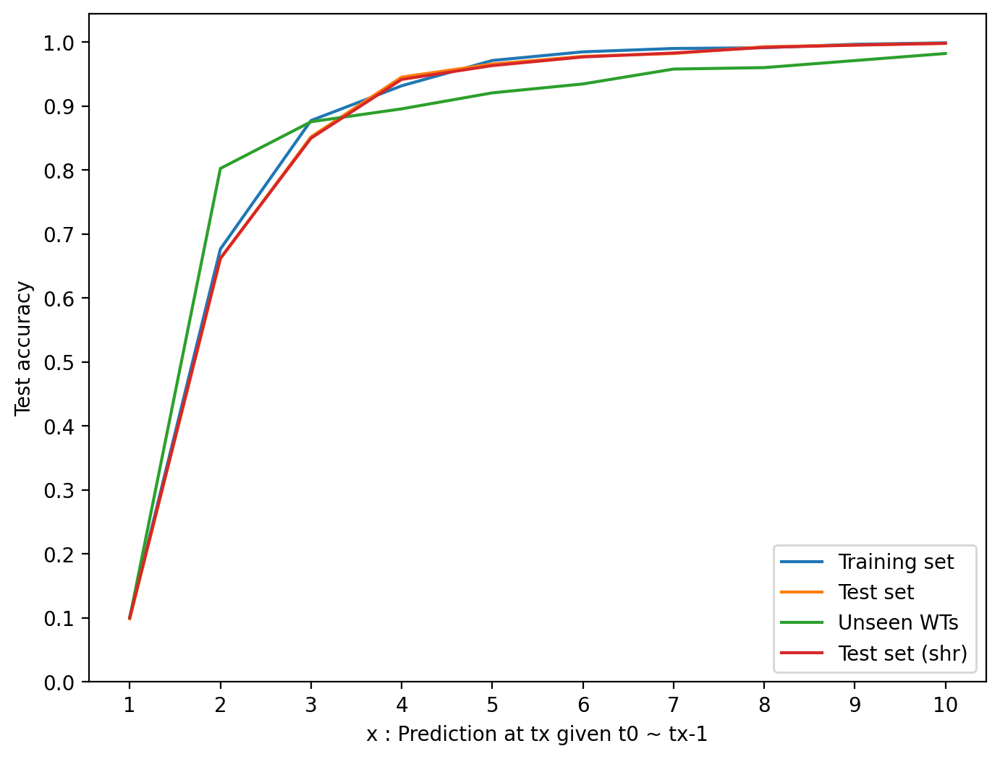

In [50]:
time = [1,2,3,4,5,6,7,8,9,10]
figure(figsize=(8, 6), dpi=100)
plt.plot(time, test_acc2, label="Training set")
plt.plot(time, test_acc, label="Test set")
plt.plot(time, test_acc3, label="Unseen WTs")
plt.plot(time, test_acc4, label="Test set (shr)")
plt.xlabel('x : Prediction at tx given t0 ~ tx-1')
plt.ylabel('Test accuracy')
plt.xticks(np.arange(1, 11, 1.0))
plt.yticks(np.arange(0, 1.1, 0.1))
plt.legend(loc='lower right')